In [4]:
pip install seaborn

   ---------------------------------------- 293.3/293.3 kB 9.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np 
import os
import keras
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from keras.models import Sequential
from PIL import Image
from keras.layers import Conv2D,Flatten,Dense,Dropout,BatchNormalization,MaxPooling2D
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

Import Dataset

In [4]:
path1 = []
path2 = []
path3 = []
path4 = []
for dirname, _, filenames in os.walk('C:/Users/USER/Desktop/브레이니화_딥러닝/Kaggle/Non Demented'):
    for filename in filenames:
        path1.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('C:/Users/USER/Desktop/브레이니화_딥러닝/Kaggle/Mild Dementia'):
    for filename in filenames:
        path2.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('C:/Users/USER/Desktop/브레이니화_딥러닝/Kaggle/Moderate Dementia'):
    for filename in filenames:
        path3.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('C:/Users/USER/Desktop/브레이니화_딥러닝/Kaggle/Very mild Dementia'):
    for filename in filenames:
        path4.append(os.path.join(dirname, filename))  
        
path1 = path1[0:100]
path2 = path2[0:100]
path3 = path3[0:100]
path4 = path4[0:100]

One Hot Encoding

In [5]:
encoder = OneHotEncoder()
encoder.fit([[0],[1],[2],[3]])

# 0 --> Non Demented
# 1 --> Mild Dementia
# 2 --> Moderate Dementia
# 3 --> Very Mild Dementia

OneHotEncoder()

In [6]:
data = []
result = []
for path in path1:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[0]]).toarray())
        
for path in path2:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[1]]).toarray()) 
        
for path in path3:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[2]]).toarray())
        
for path in path4:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[3]]).toarray())

In [7]:
data = np.array(data)
data.shape

(400, 128, 128, 3)

In [8]:
result = np.array(result)
result = result.reshape((400,4))
result.shape

(400, 4)

In [9]:
x_train,x_test,y_train,y_test = train_test_split(
    data,result,test_size=0.15,shuffle=True,random_state=42)

In [10]:
print(y_train.shape)
print(x_train.shape)

(340, 4)
(340, 128, 128, 3)


# CNN model

1. 기존과 동일 ~과적합
https://www.kaggle.com/code/kirollosashraf/oasis-alzheimer-s-detection

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 128, 128, 32)      416       
                                                                 
 conv2d_9 (Conv2D)           (None, 128, 128, 32)      4128      
                                                                 
 batch_normalization_4 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 64, 64, 32)        0         
                                                                 
 conv2d_10 (Conv2D)          (None, 64, 64, 64)       

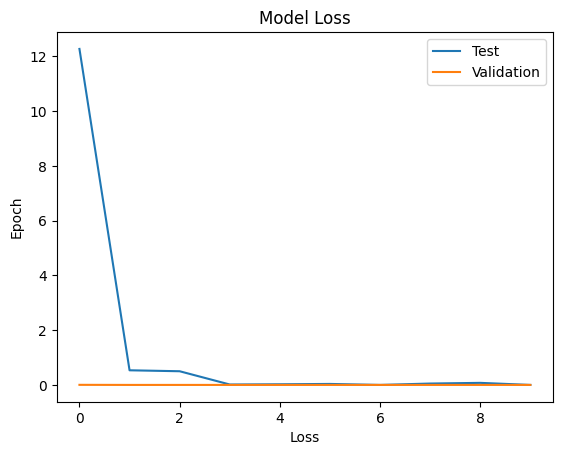

In [24]:
model = Sequential()

model.add(Conv2D(32,kernel_size =(2,2),input_shape = (128,128,3),padding = 'Same'))
model.add(Conv2D(32,kernel_size =(2,2),activation='relu',padding = 'Same'))

model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(64,kernel_size =(2,2),activation='relu',padding = 'Same'))
model.add(Conv2D(64,kernel_size =(2,2),activation='relu',padding = 'Same'))

model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2),strides = (2,2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512,activation = 'relu'))
model.add(Dropout(0.5))
model.add(Dense(4,activation='softmax'))
          
model.compile(loss = 'categorical_crossentropy',optimizer = 'Adamax',metrics=['accuracy'])
          
print(model.summary())

history = model.fit(x_train,y_train,epochs=10,batch_size=10,verbose=1,validation_data=(x_test,y_test))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Loss')
plt.ylabel('Epoch')
plt.legend(['Test','Validation'],loc='upper right')
plt.show()

Class: Non Demented


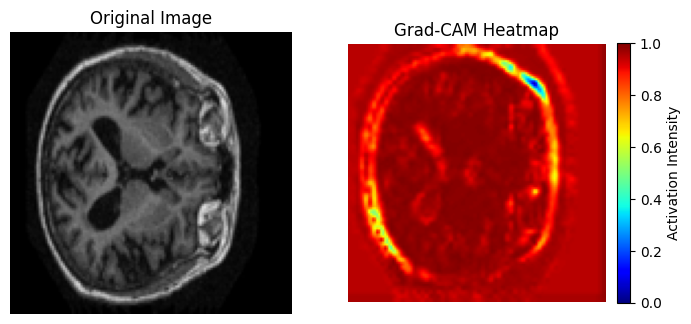

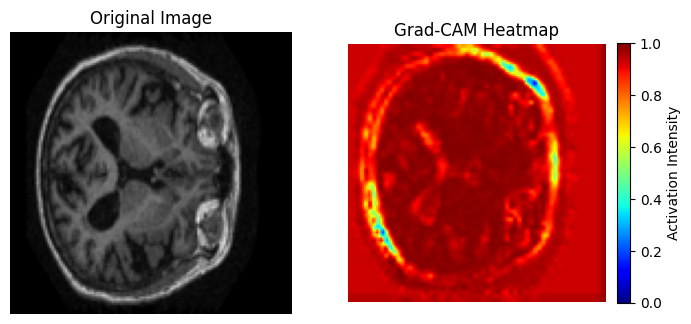

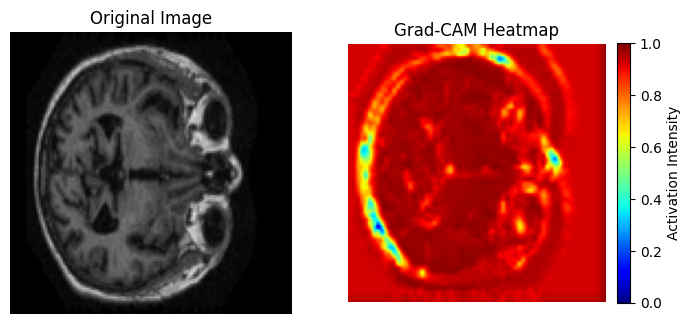

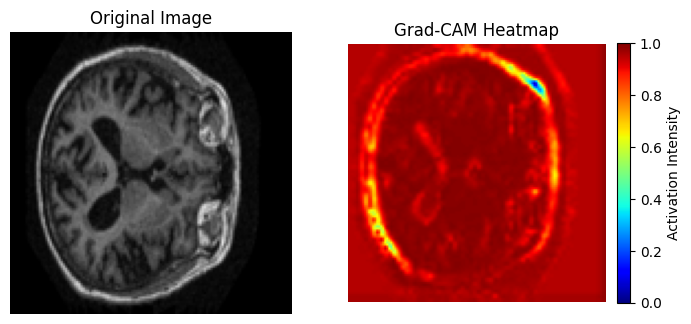

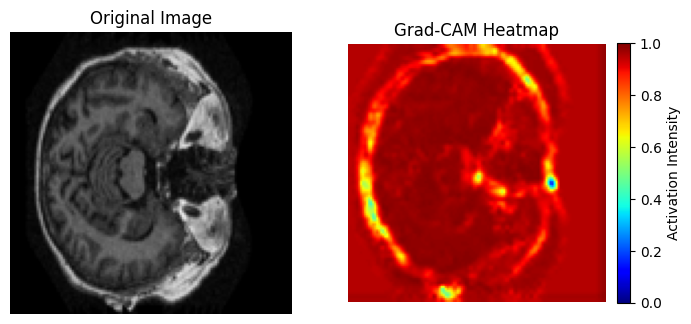

Class: Mild Dementia


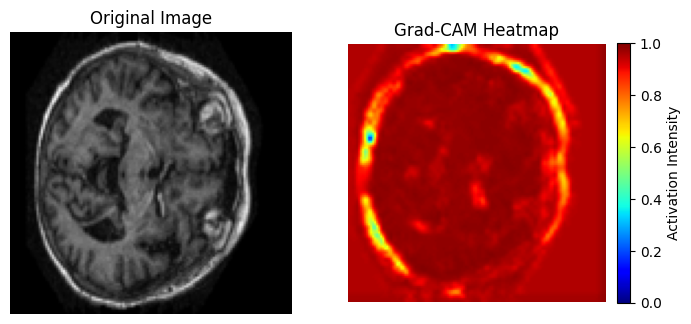

c:\Users\USER\.conda\envs\syrr\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


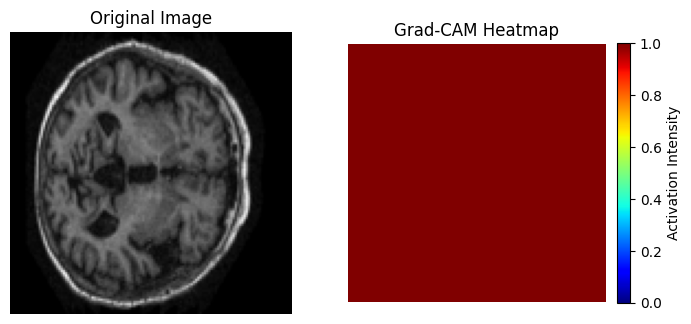

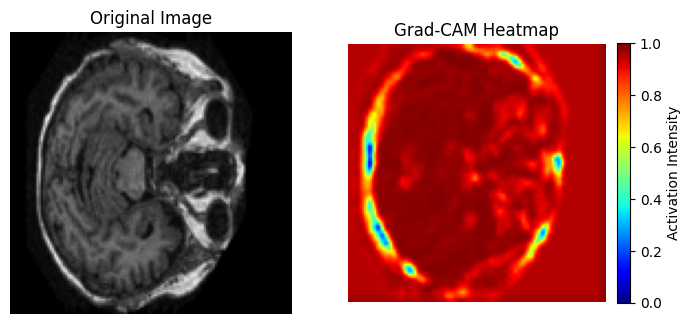

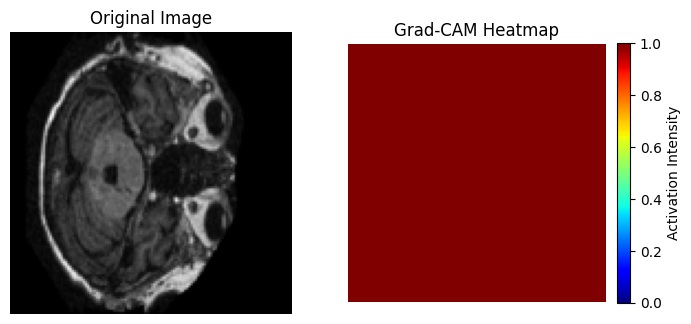

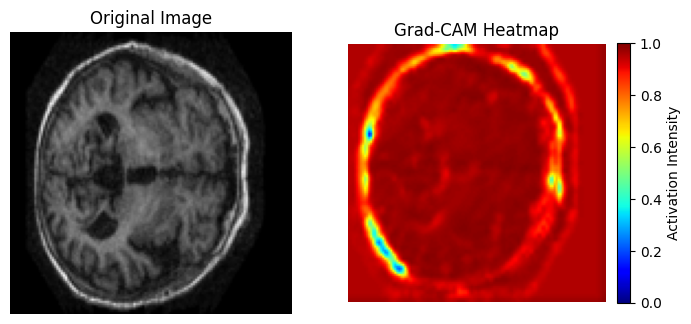

Class: Moderate Dementia


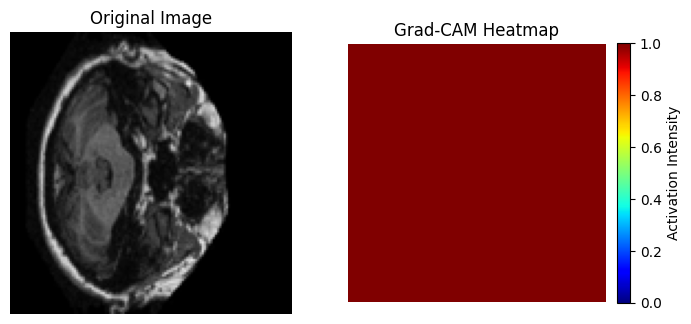

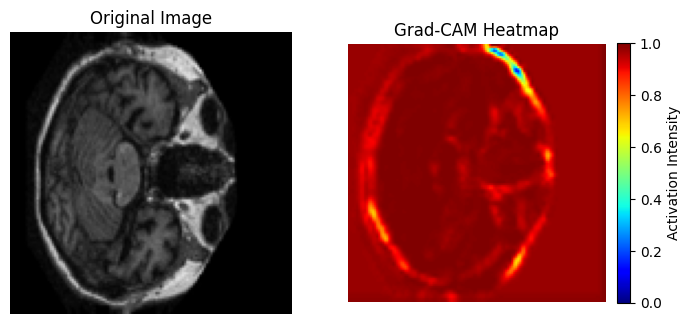

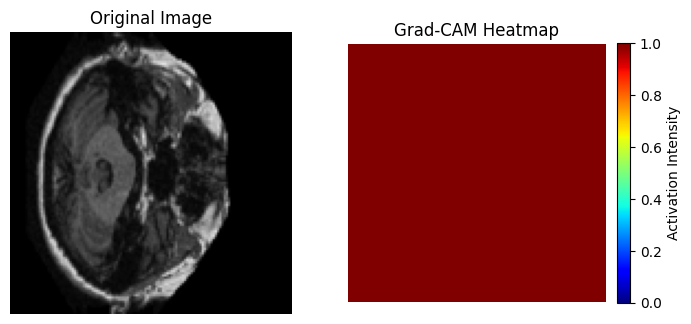

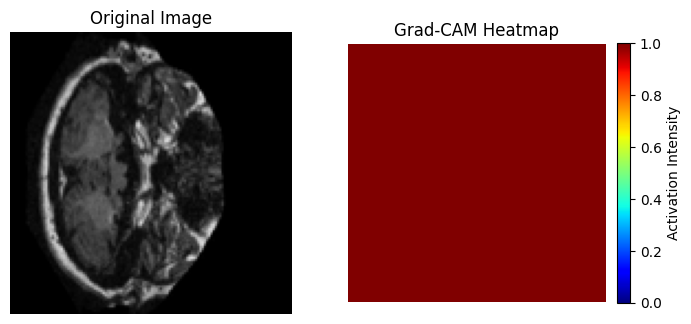

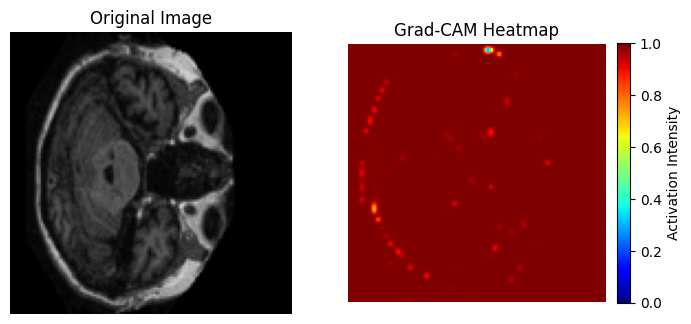

Class: Very Mild Dementia


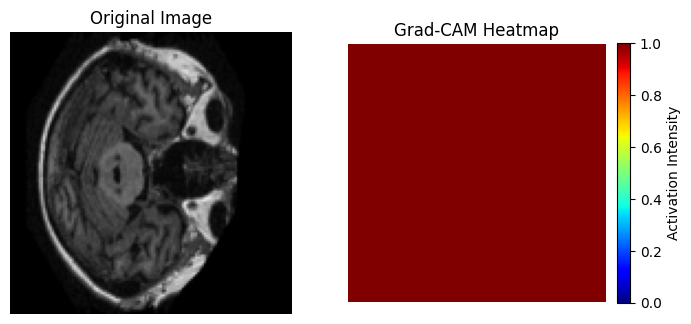

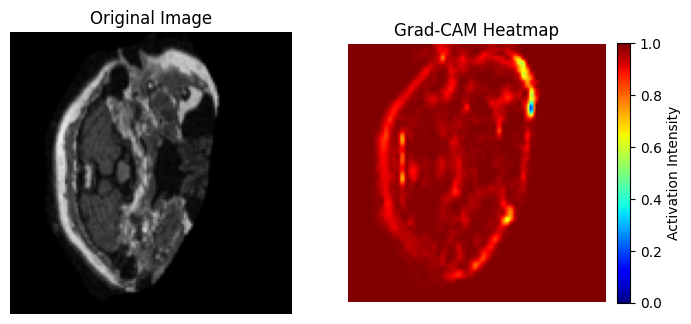

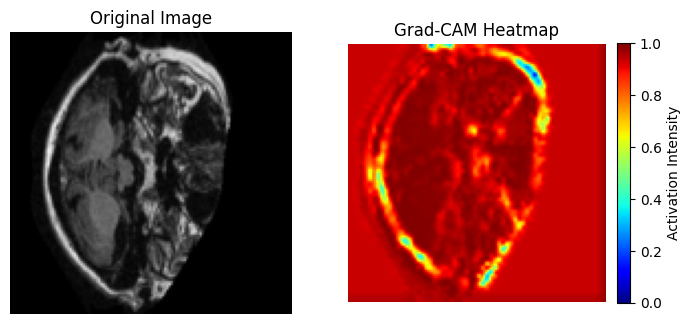

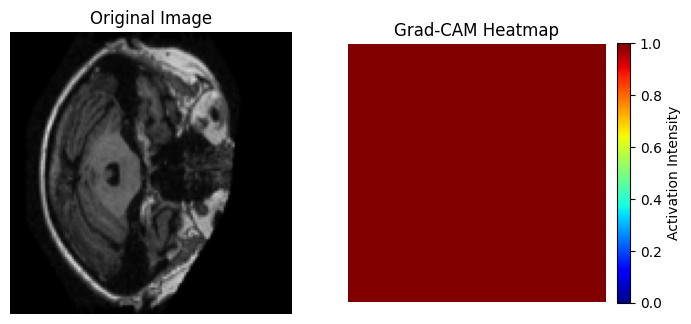

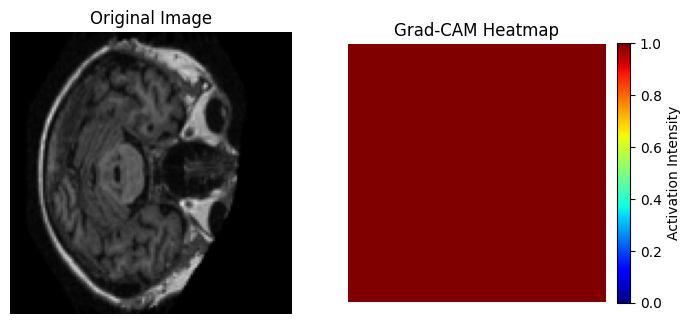

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
import cv2

# Grad-CAM 함수 정의
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

# Grad-CAM 적용 및 시각화
def display_gradcam_images(x_data, y_data, model, last_conv_layer_name, class_labels, num_images=5):
    for class_index in range(len(class_labels)):
        print(f"Class: {class_labels[class_index]}")
        count = 0
        for i in range(len(x_data)):
            if np.argmax(y_data[i]) == class_index:
                img = x_data[i]
                img_array = np.expand_dims(img, axis=0)
                heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
                
                # 원본 이미지에 Heatmap 적용
                heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
                heatmap_resized = np.uint8(255 * heatmap_resized)
                heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
                superimposed_img = cv2.addWeighted(img, 0.6, heatmap_resized, 0.4, 0)

                # 이미지 출력
                plt.figure(figsize=(8, 4))

                # 왼쪽: 원본 이미지
                plt.subplot(1, 2, 1)
                plt.imshow(img, cmap='gray')
                plt.title("Original Image")
                plt.axis('off')

                # 오른쪽: Grad-CAM Heatmap
                plt.subplot(1, 2, 2)
                plt.imshow(heatmap_resized)
                plt.title("Grad-CAM Heatmap")
                plt.axis('off')

                # 색상 범례 추가
                cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='jet'), orientation='vertical', fraction=0.046, pad=0.04)
                cbar.set_label('Activation Intensity')

                plt.show()

                count += 1
                if count >= num_images:
                    break

# Grad-CAM 실행
class_labels = ['Non Demented', 'Mild Dementia', 'Moderate Dementia', 'Very Mild Dementia']
display_gradcam_images(x_test, y_test, model, 'conv2d_11', class_labels)


2. 수정

드롭아웃 비율을 늘려 과적합 방지.
Dense 층의 뉴런 수를 512에서 256으로 줄여 복잡도를 낮춤.
배치 크기를 10에서 32로 증가시켜 학습 효율 향상.

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 128, 128, 32)      416       
                                                                 
 conv2d_13 (Conv2D)          (None, 128, 128, 32)      4128      
                                                                 
 batch_normalization_6 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 dropout_9 (Dropout)         (None, 64, 64, 32)        0         
                                                                 
 conv2d_14 (Conv2D)          (None, 64, 64, 64)       

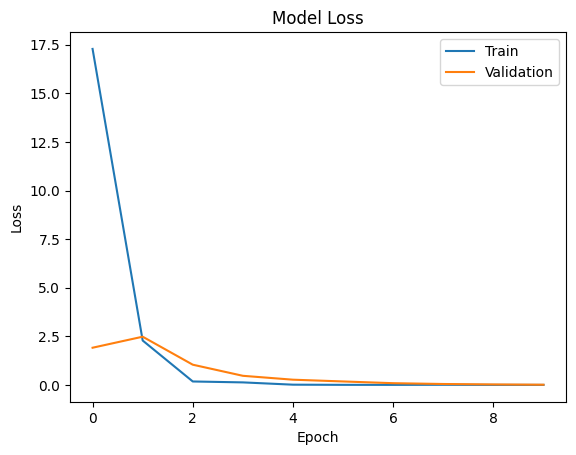

In [26]:
model1 = Sequential()

model1.add(Conv2D(32, kernel_size=(2, 2), input_shape=(128, 128, 3), padding='Same'))
model1.add(Conv2D(32, kernel_size=(2, 2), activation='relu', padding='Same'))
model1.add(BatchNormalization())
model1.add(MaxPooling2D(pool_size=(2, 2)))
model1.add(Dropout(0.3))  # 드롭아웃 비율 증가

model1.add(Conv2D(64, kernel_size=(2, 2), activation='relu', padding='Same'))
model1.add(Conv2D(64, kernel_size=(2, 2), activation='relu', padding='Same'))
model1.add(BatchNormalization())
model1.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model1.add(Dropout(0.4))  # 드롭아웃 비율 증가

model1.add(Flatten())
model1.add(Dense(256, activation='relu'))  # 뉴런 수 감소
model1.add(Dropout(0.5))
model1.add(Dense(4, activation='softmax'))

model1.compile(loss='categorical_crossentropy', optimizer='Adamax', metrics=['accuracy'])

print(model1.summary())

history = model1.fit(x_train, y_train, epochs=10, batch_size=32, verbose=1, validation_data=(x_test, y_test))

# 손실 그래프
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


Class: Non Demented


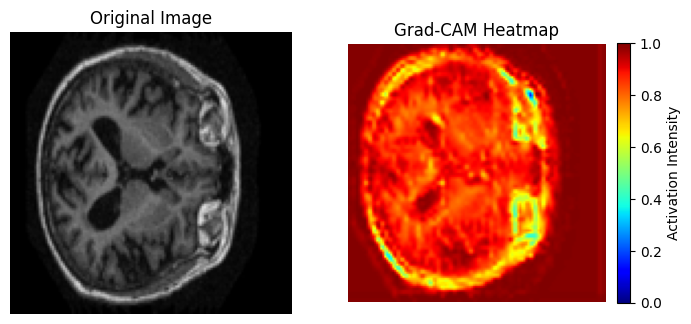

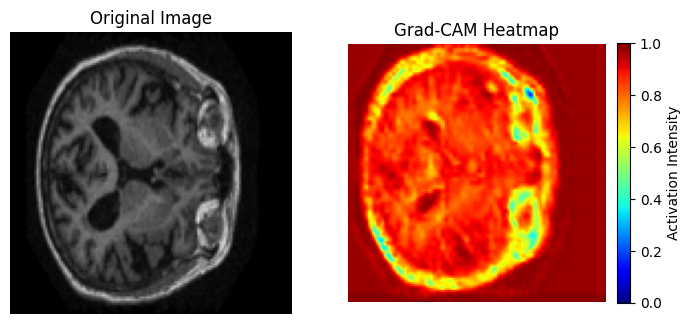

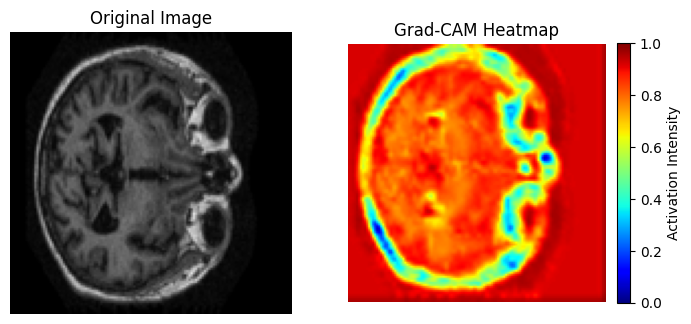

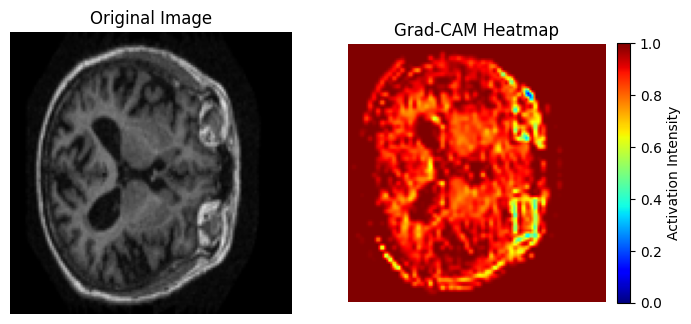

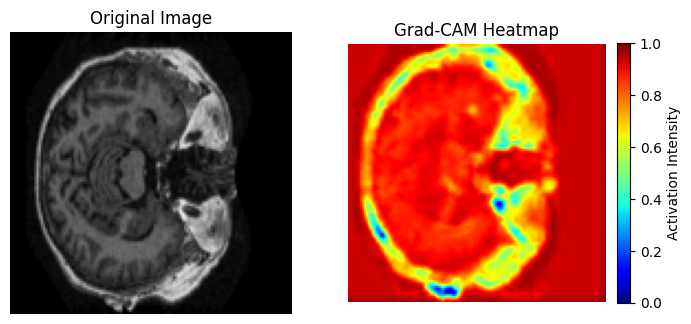

Class: Mild Dementia


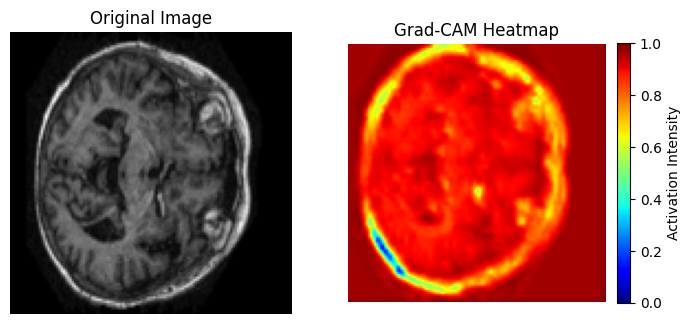

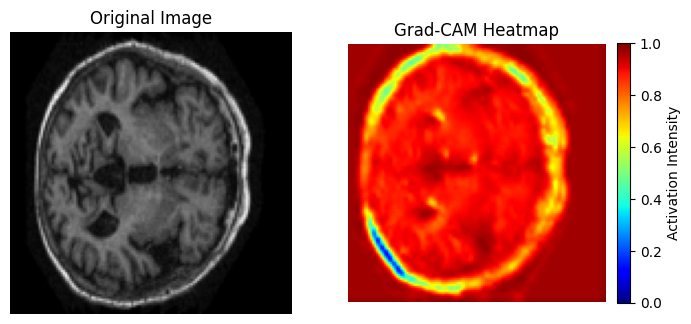

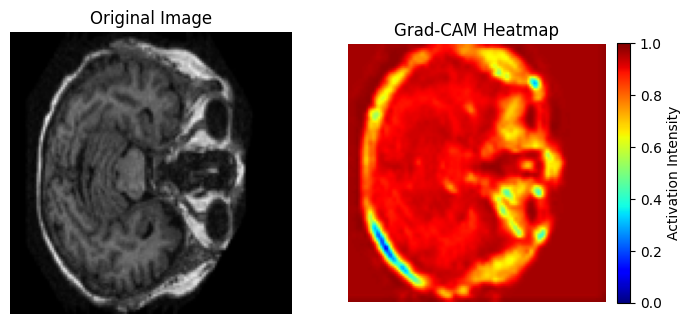

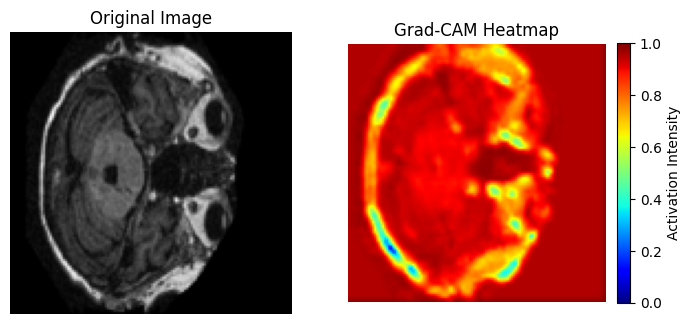

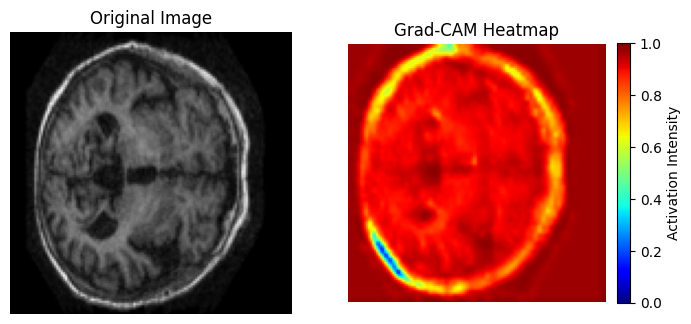

Class: Moderate Dementia


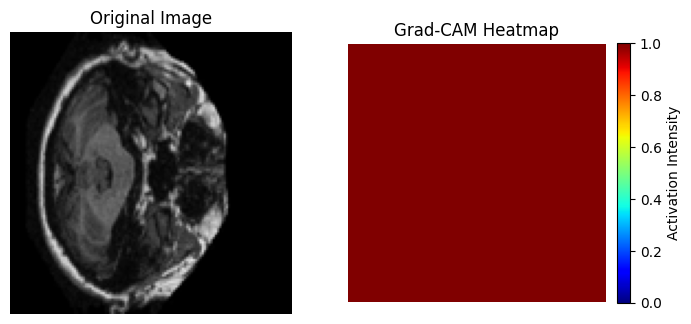

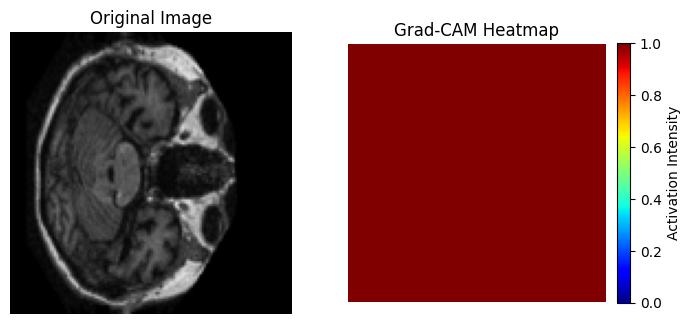

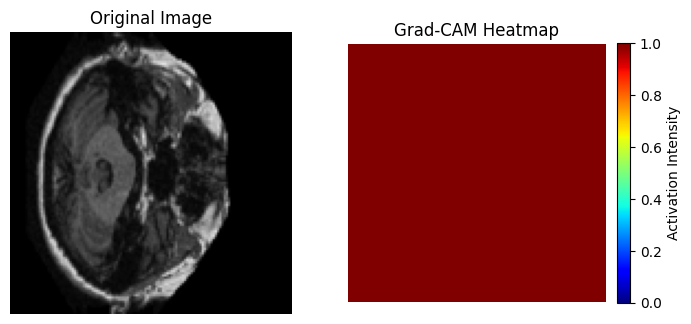

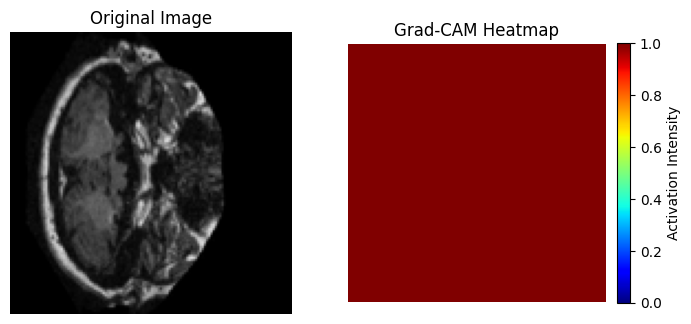

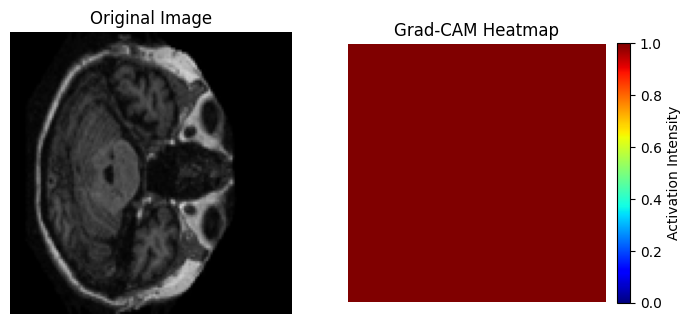

Class: Very Mild Dementia


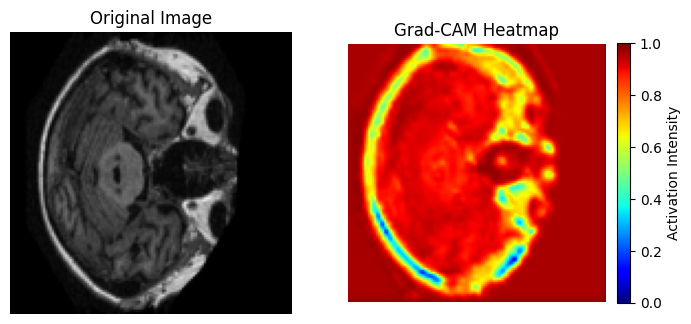

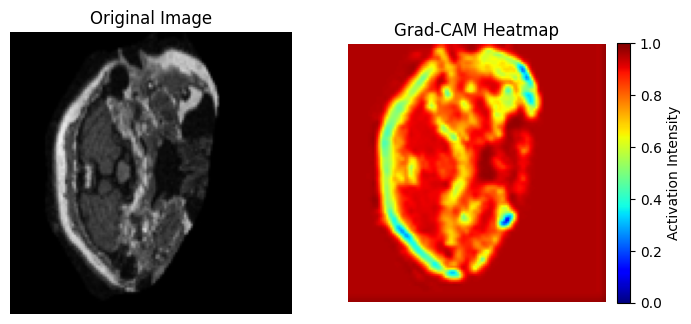

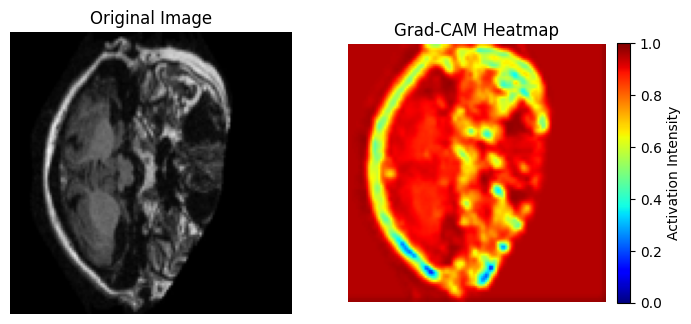

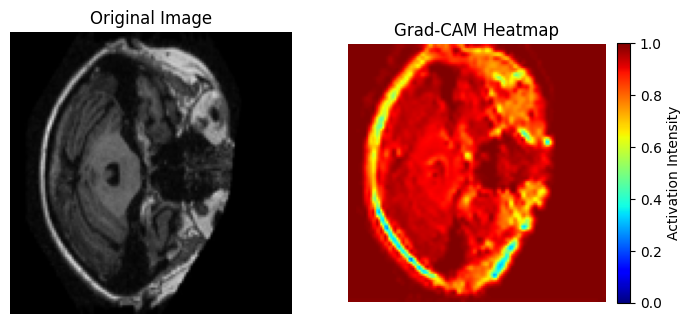

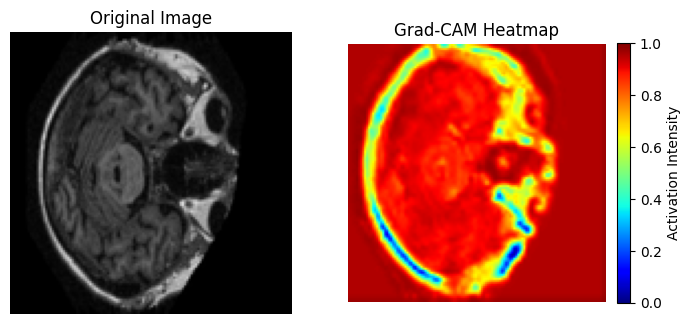

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
import cv2

# Grad-CAM 함수 정의
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

# Grad-CAM 적용 및 시각화
def display_gradcam_images(x_data, y_data, model, last_conv_layer_name, class_labels, num_images=5):
    for class_index in range(len(class_labels)):
        print(f"Class: {class_labels[class_index]}")
        count = 0
        for i in range(len(x_data)):
            if np.argmax(y_data[i]) == class_index:
                img = x_data[i]
                img_array = np.expand_dims(img, axis=0)
                heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
                
                # 원본 이미지에 Heatmap 적용
                heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
                heatmap_resized = np.uint8(255 * heatmap_resized)
                heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
                superimposed_img = cv2.addWeighted(img, 0.6, heatmap_resized, 0.4, 0)

                # 이미지 출력
                plt.figure(figsize=(8, 4))

                # 왼쪽: 원본 이미지
                plt.subplot(1, 2, 1)
                plt.imshow(img, cmap='gray')
                plt.title("Original Image")
                plt.axis('off')

                # 오른쪽: Grad-CAM Heatmap
                plt.subplot(1, 2, 2)
                plt.imshow(heatmap_resized)
                plt.title("Grad-CAM Heatmap")
                plt.axis('off')

                # 색상 범례 추가
                cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='jet'), orientation='vertical', fraction=0.046, pad=0.04)
                cbar.set_label('Activation Intensity')

                plt.show()

                count += 1
                if count >= num_images:
                    break

# Grad-CAM 실행
class_labels = ['Non Demented', 'Mild Dementia', 'Moderate Dementia', 'Very Mild Dementia']
display_gradcam_images(x_test, y_test, model1, 'conv2d_15', class_labels)


수정2 : 배치 노말리제이션 추가 및 얼리스타핑, accuracy 그래프 추가

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 128, 128, 32)      416       
                                                                 
 batch_normalization_8 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 conv2d_17 (Conv2D)          (None, 128, 128, 32)      4128      
                                                                 
 batch_normalization_9 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                      

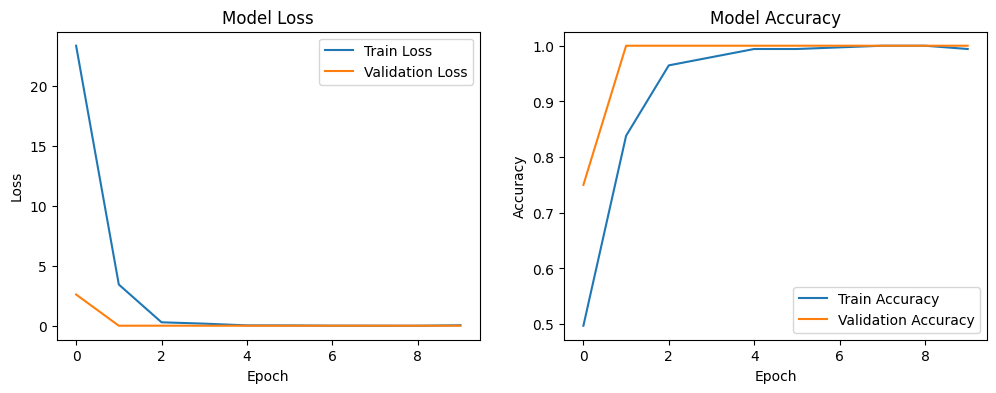

In [28]:
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

model2 = Sequential()

model2.add(Conv2D(32, kernel_size=(2, 2), input_shape=(128, 128, 3), padding='Same'))
model2.add(BatchNormalization())
model2.add(Conv2D(32, kernel_size=(2, 2), activation='relu', padding='Same'))
model2.add(BatchNormalization())
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.3))

model2.add(Conv2D(64, kernel_size=(2, 2), activation='relu', padding='Same'))
model2.add(BatchNormalization())
model2.add(Conv2D(64, kernel_size=(2, 2), activation='relu', padding='Same'))
model2.add(BatchNormalization())
model2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model2.add(Dropout(0.4))

model2.add(Flatten())
model2.add(Dense(256, activation='relu'))
model2.add(Dropout(0.5))
model2.add(Dense(4, activation='softmax'))

model2.compile(loss='categorical_crossentropy', optimizer='Adamax', metrics=['accuracy'])

# EarlyStopping 설정
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

print(model2.summary())

history = model2.fit(x_train, y_train, epochs=10, batch_size=32, verbose=1,
                    validation_data=(x_test, y_test), callbacks=[early_stopping])

# 손실 및 정확도 그래프
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()


Class: Non Demented


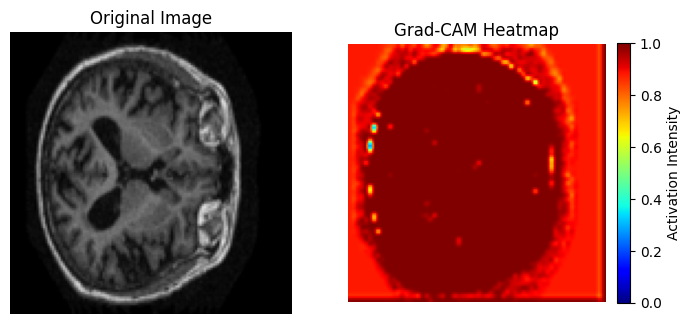

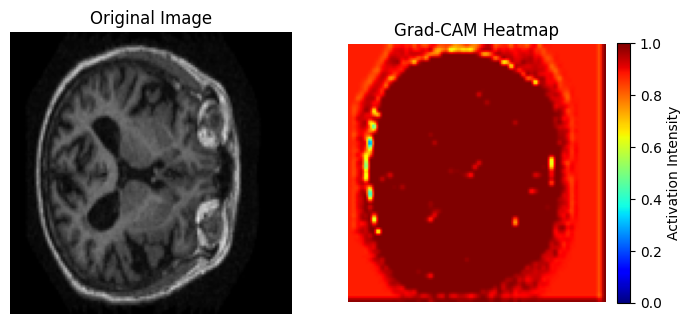

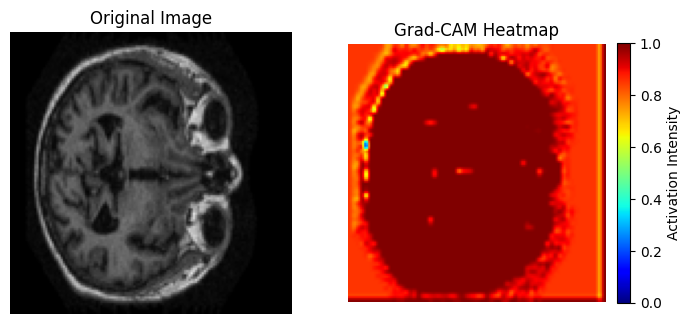

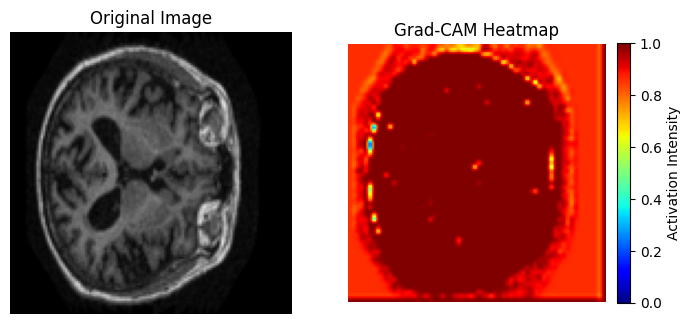

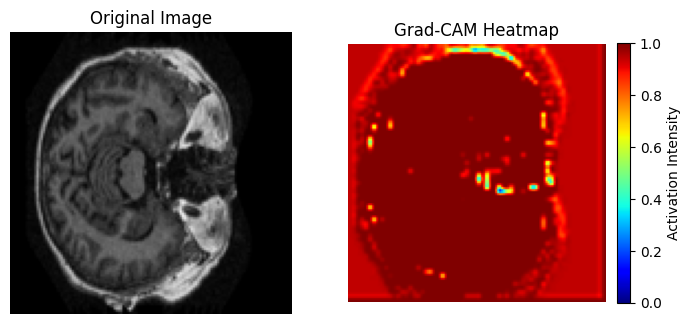

Class: Mild Dementia


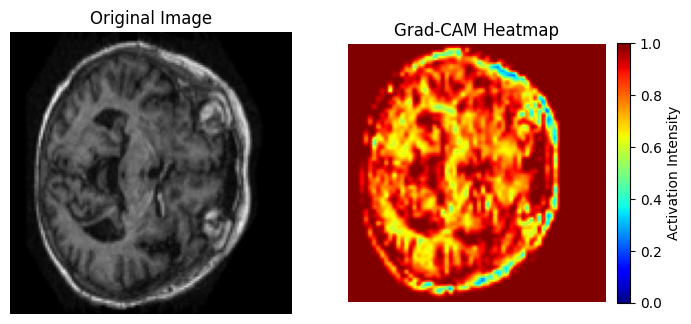

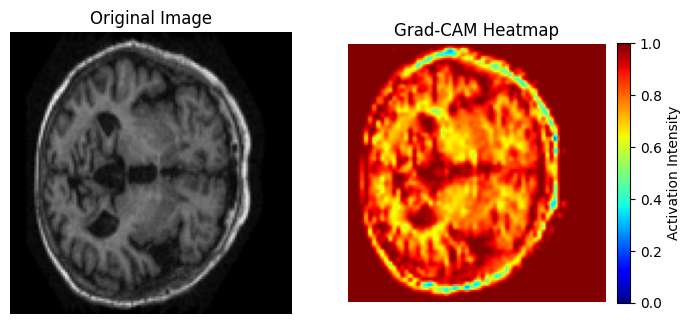

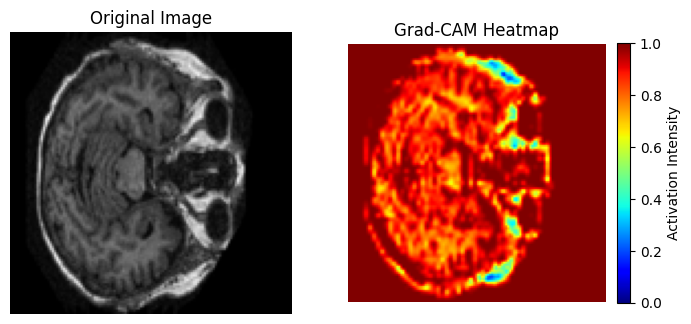

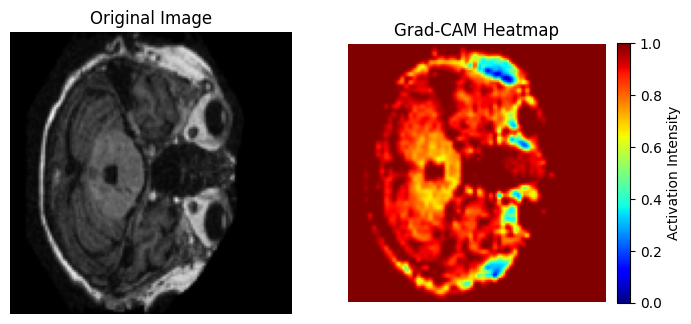

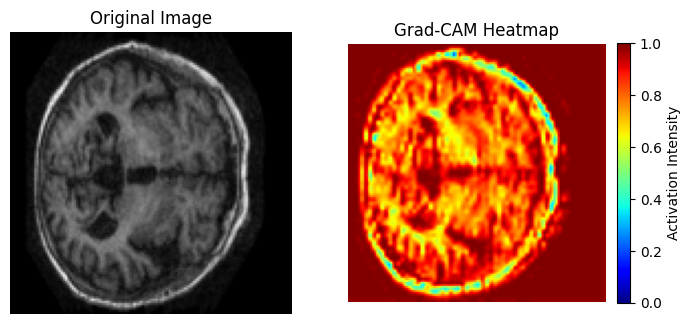

Class: Moderate Dementia


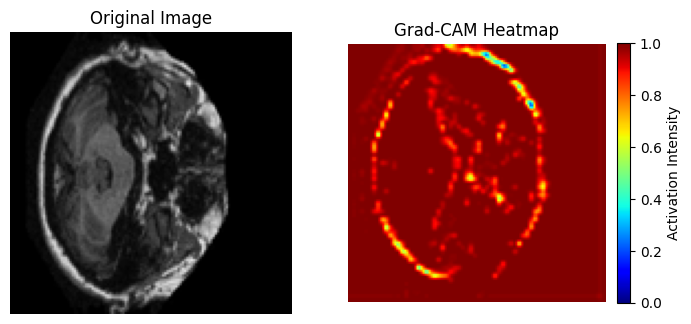

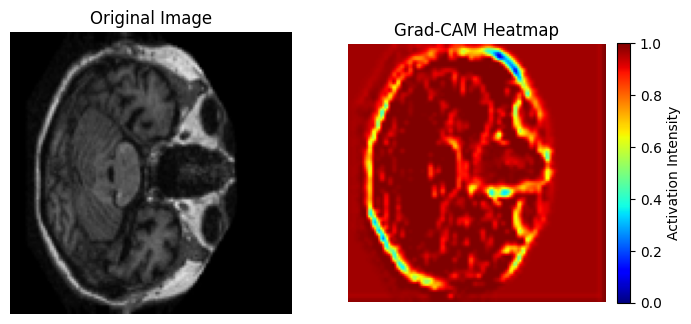

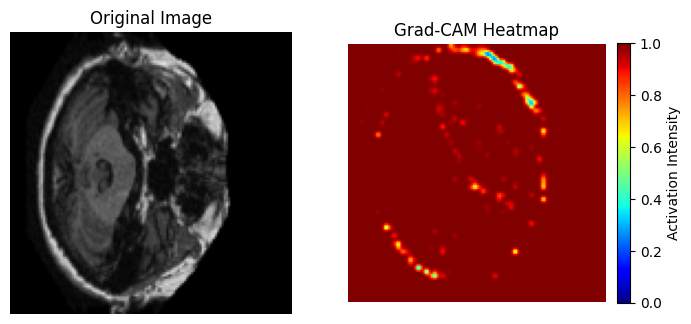

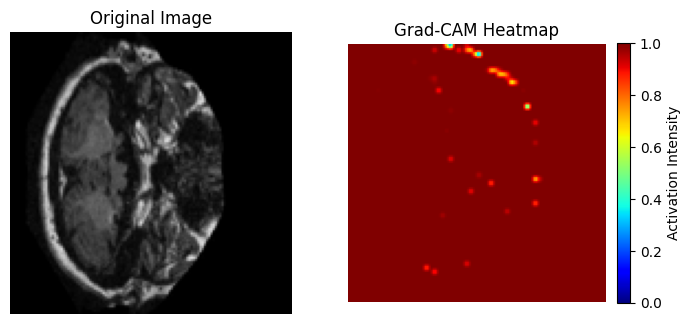

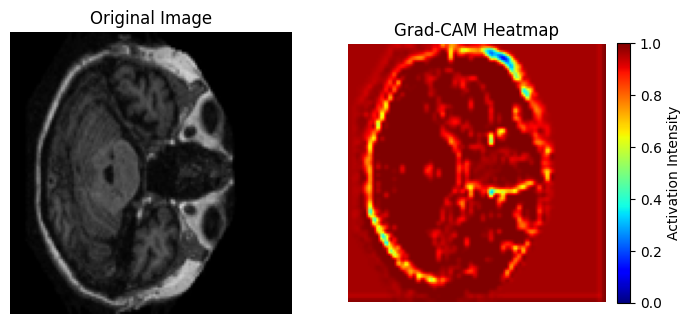

Class: Very Mild Dementia


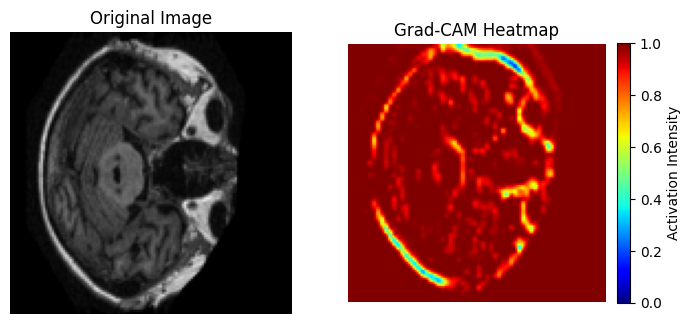

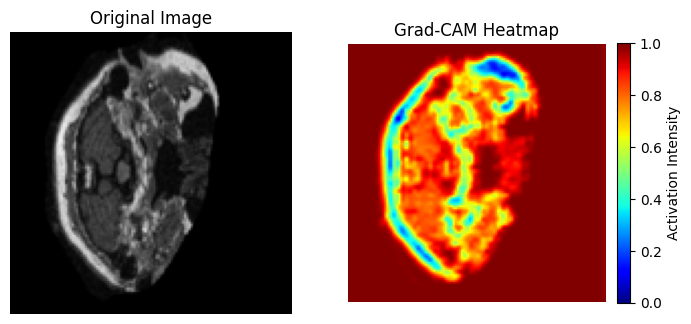

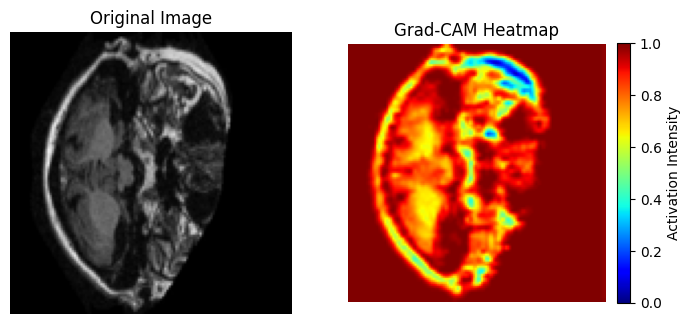

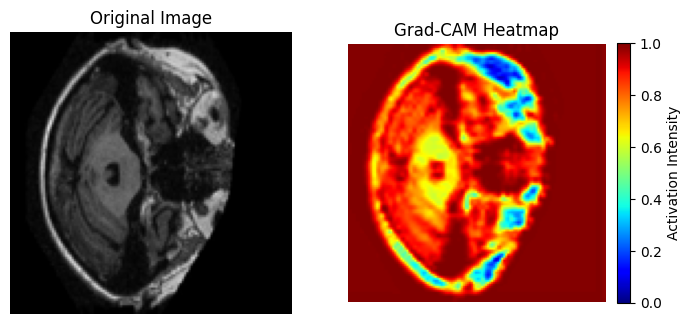

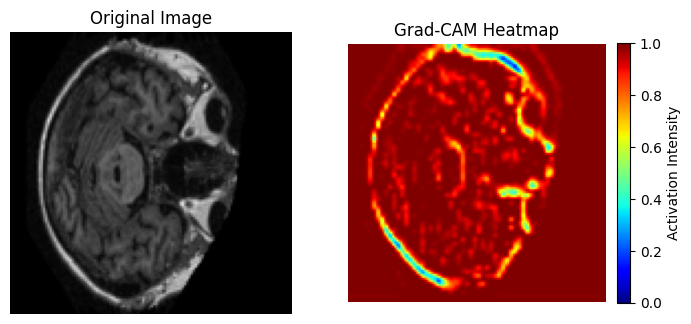

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
import cv2

# Grad-CAM 함수 정의
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

# Grad-CAM 적용 및 시각화
def display_gradcam_images(x_data, y_data, model, last_conv_layer_name, class_labels, num_images=5):
    for class_index in range(len(class_labels)):
        print(f"Class: {class_labels[class_index]}")
        count = 0
        for i in range(len(x_data)):
            if np.argmax(y_data[i]) == class_index:
                img = x_data[i]
                img_array = np.expand_dims(img, axis=0)
                heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
                
                # 원본 이미지에 Heatmap 적용
                heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
                heatmap_resized = np.uint8(255 * heatmap_resized)
                heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
                superimposed_img = cv2.addWeighted(img, 0.6, heatmap_resized, 0.4, 0)

                # 이미지 출력
                plt.figure(figsize=(8, 4))

                # 왼쪽: 원본 이미지
                plt.subplot(1, 2, 1)
                plt.imshow(img, cmap='gray')
                plt.title("Original Image")
                plt.axis('off')

                # 오른쪽: Grad-CAM Heatmap
                plt.subplot(1, 2, 2)
                plt.imshow(heatmap_resized)
                plt.title("Grad-CAM Heatmap")
                plt.axis('off')

                # 색상 범례 추가
                cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='jet'), orientation='vertical', fraction=0.046, pad=0.04)
                cbar.set_label('Activation Intensity')

                plt.show()

                count += 1
                if count >= num_images:
                    break

# Grad-CAM 실행
class_labels = ['Non Demented', 'Mild Dementia', 'Moderate Dementia', 'Very Mild Dementia']
display_gradcam_images(x_test, y_test, model2, 'conv2d_18', class_labels)


3. 기존 모델에 적용하기

Epoch 1/10
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
11/11 [==============================] - ETA: 0s - loss: 3.2439 - accuracy: 0.4882WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x000002A83B34D4C8> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) 

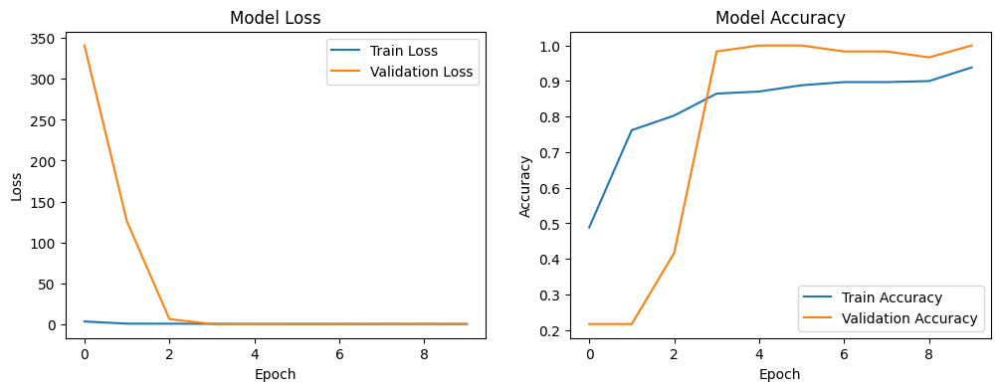

In [31]:
from tensorflow.keras import models, layers
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# 모델 정의
def generate_model(input_shape):
    model = models.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.BatchNormalization())  # 배치 정규화 추가
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Dropout(0.3))  # 드롭아웃 추가 및 비율 조정

    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())  # 배치 정규화 추가
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Dropout(0.4))  # 드롭아웃 추가 및 비율 조정

    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.BatchNormalization())  # 배치 정규화 추가
    model.add(layers.Flatten())

    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dropout(0.5))  # 드롭아웃 추가 및 비율 조정
    model.add(layers.Dense(4, activation='softmax'))  # 다중 분류

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',  # 다중 분류
                  metrics=['accuracy'])
    return model

# EarlyStopping 설정
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# 모델 생성 및 학습
input_shape = (128, 128, 3)
model = generate_model(input_shape)

history = model.fit(x_train, y_train, epochs=10, batch_size=32, verbose=1,
                    validation_data=(x_test, y_test), callbacks=[early_stopping])

# 모델 요약 출력
print(model.summary())

# 손실 및 정확도 그래프
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()


Class: Non Demented


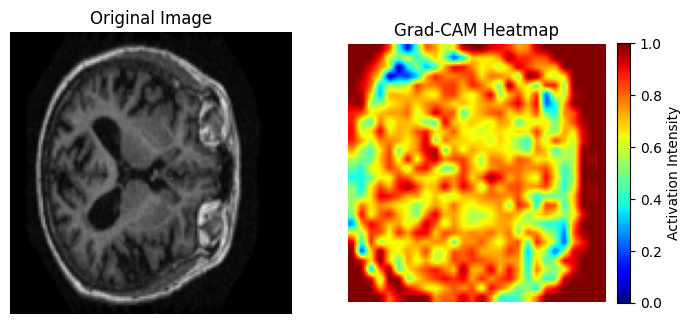

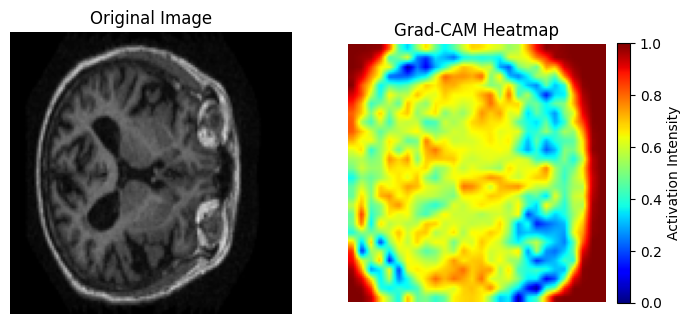

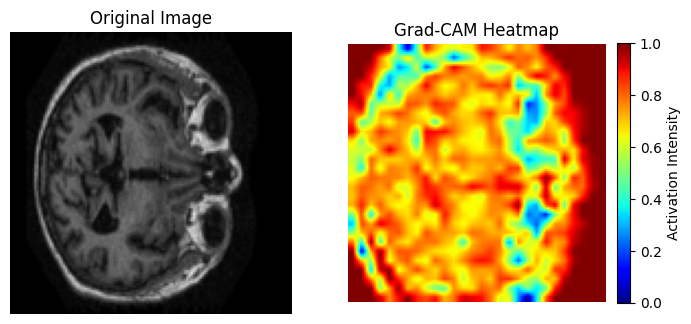

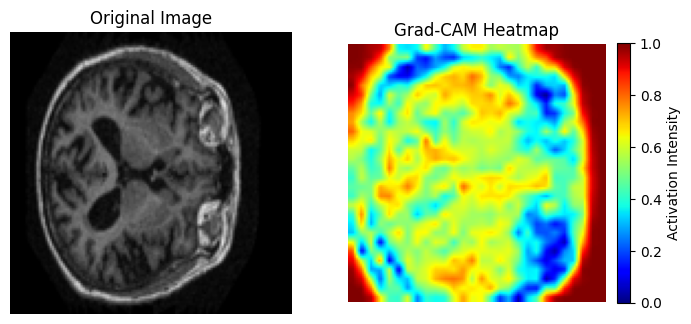

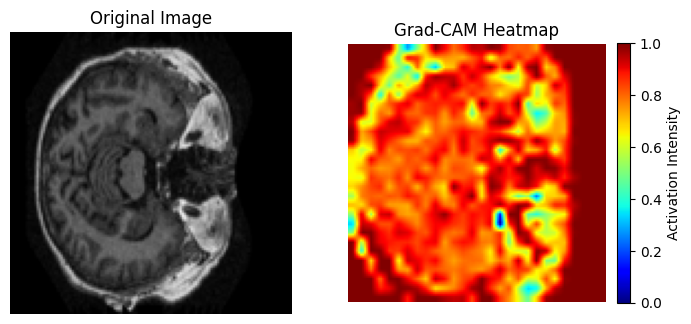

Class: Mild Dementia


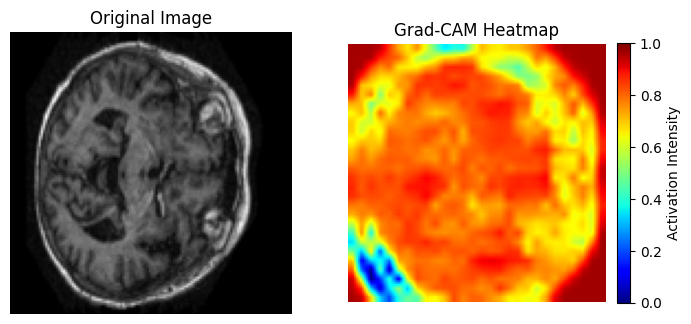

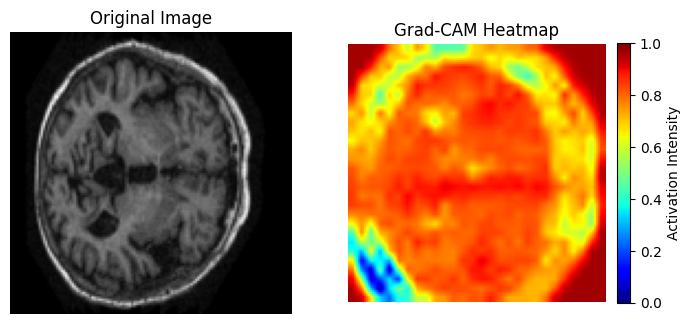

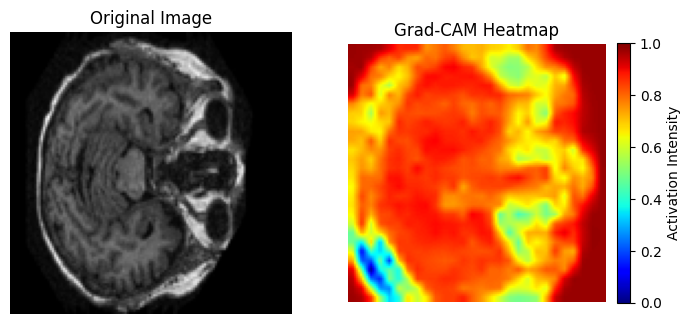

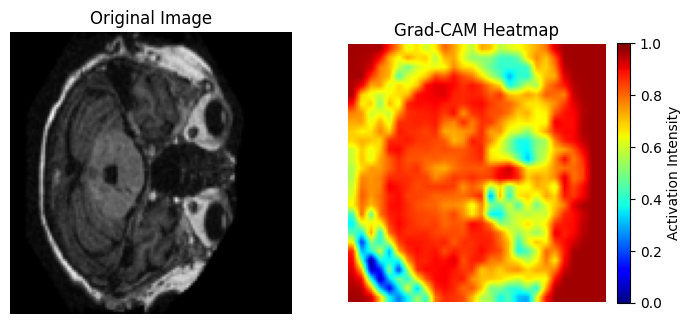

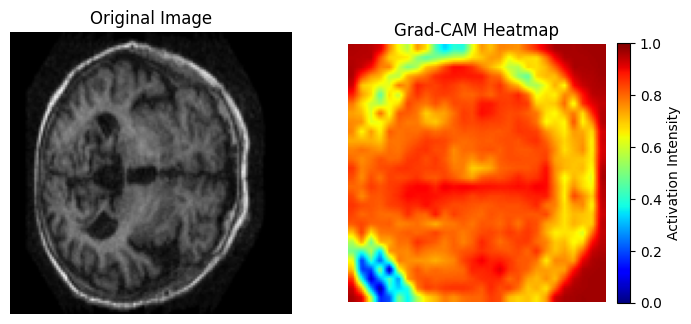

Class: Moderate Dementia


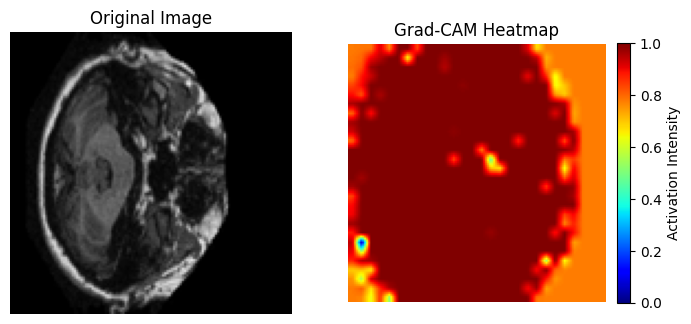

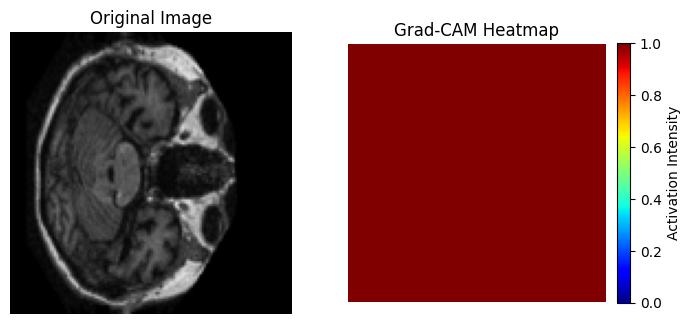

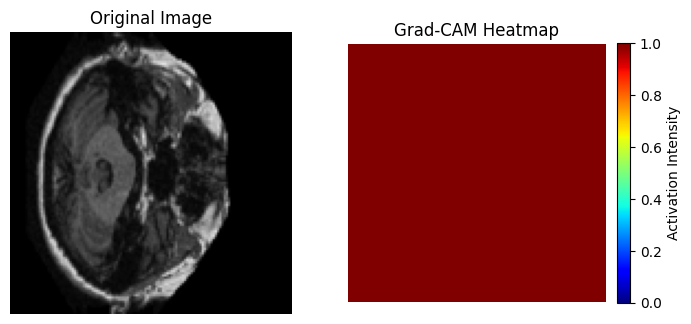

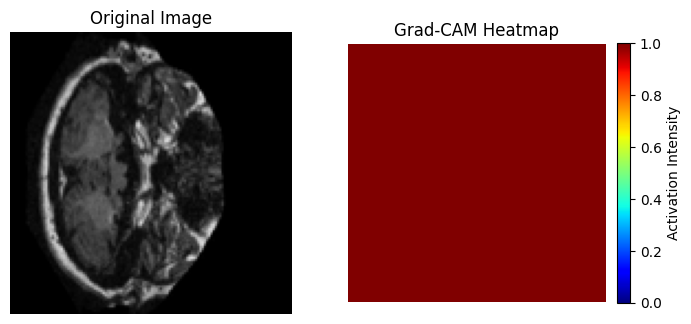

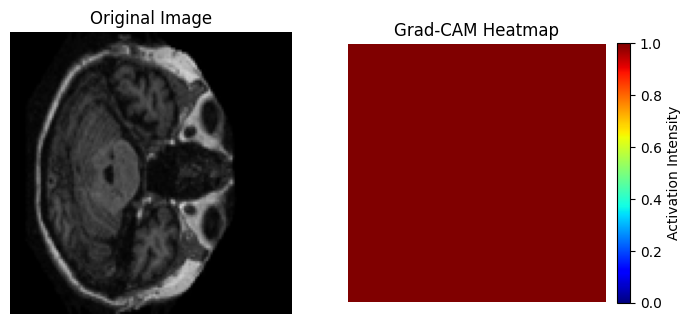

Class: Very Mild Dementia


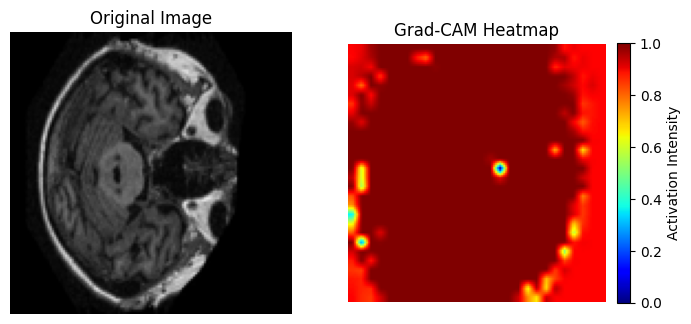

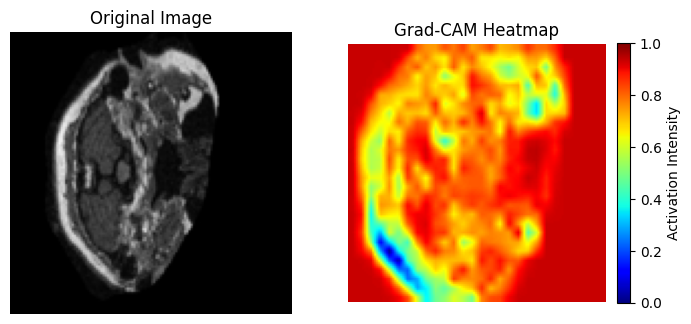

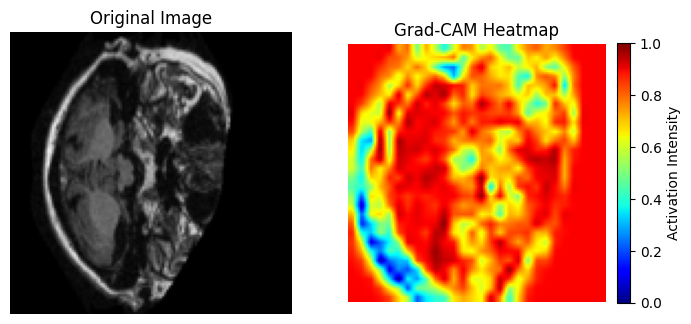

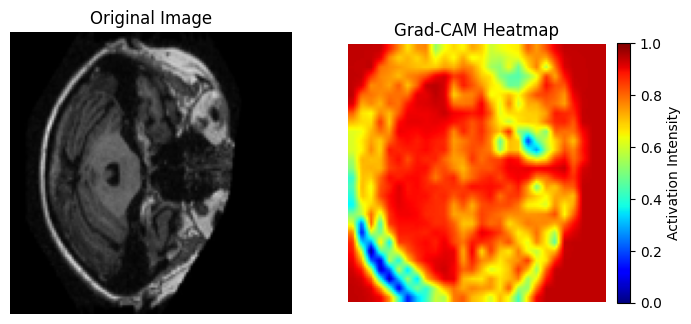

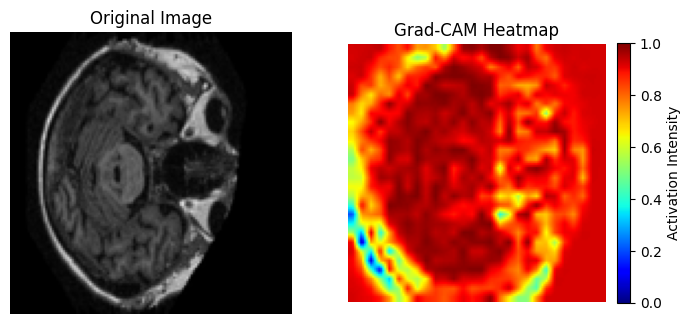

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
import cv2

# Grad-CAM 함수 정의
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

# Grad-CAM 적용 및 시각화
def display_gradcam_images(x_data, y_data, model, last_conv_layer_name, class_labels, num_images=5):
    for class_index in range(len(class_labels)):
        print(f"Class: {class_labels[class_index]}")
        count = 0
        for i in range(len(x_data)):
            if np.argmax(y_data[i]) == class_index:
                img = x_data[i]
                img_array = np.expand_dims(img, axis=0)
                heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
                
                # 원본 이미지에 Heatmap 적용
                heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
                heatmap_resized = np.uint8(255 * heatmap_resized)
                heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
                superimposed_img = cv2.addWeighted(img, 0.6, heatmap_resized, 0.4, 0)

                # 이미지 출력
                plt.figure(figsize=(8, 4))

                # 왼쪽: 원본 이미지
                plt.subplot(1, 2, 1)
                plt.imshow(img, cmap='gray')
                plt.title("Original Image")
                plt.axis('off')

                # 오른쪽: Grad-CAM Heatmap
                plt.subplot(1, 2, 2)
                plt.imshow(heatmap_resized)
                plt.title("Grad-CAM Heatmap")
                plt.axis('off')

                # 색상 범례 추가
                cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='jet'), orientation='vertical', fraction=0.046, pad=0.04)
                cbar.set_label('Activation Intensity')

                plt.show()

                count += 1
                if count >= num_images:
                    break

# Grad-CAM 실행
class_labels = ['Non Demented', 'Mild Dementia', 'Moderate Dementia', 'Very Mild Dementia']
display_gradcam_images(x_test, y_test, model, 'conv2d_25', class_labels)
